In [4]:
!pip install -U tensorflow_datasets tensorflow
!pip install -U importlib_resources

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 58.5 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 572.6/572.6 MB 3.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.9/4.9 MB 95.1 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 340.4/340.4 kB 20.9 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 5.29.5
    Uninstalling protobuf-5.29.5:
      Successfully uninstalled protobuf-5.29.5
  Attempting uninstall: h5py
    Found existing installation: h5py 3.16.0
    Uninstalling h5py-3.16.0:
      Successfully uninstalled h5py-3.16.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.20.0
    Uninstalling tensorflow-2.20.0:
      Successfully uninstalled tensorflow-2.20.0
  Attempting uninstall: tensorflow_datasets
    Found existing installation: tensorflow-datasets 4.9.9
    Uninstalling tensorflow-datasets-4.9.9:
      Successfully uninstalled

In [5]:
import os, time, random, gc, pickle

os.environ["CUDA_VISIBLE_DEVICES"] = "0"

os.environ["TF_XLA_FLAGS"] = "--tf_xla_auto_jit=0"

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.keras import layers, regularizers
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
import tensorflow_datasets as tfds
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

SEED = 42
tf.keras.utils.set_random_seed(SEED)
np.random.seed(SEED)
tf.config.optimizer.set_jit(False)

gpus = tf.config.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)

IMG_SIZE = 224
NUM_CLASSES = 37
BATCH_SIZE = 32
EPOCHS = 5
AUTOTUNE = tf.data.AUTOTUNE

TRAIN_SIZE = 2500
VAL_SIZE = 500
TEST_SIZE = 500

def reset_memory():
    tf.keras.backend.clear_session()
    gc.collect()

print("TensorFlow:", tf.__version__)
print("GPU available:", tf.config.list_physical_devices('GPU'))

TensorFlow: 2.21.0
GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [6]:
TFDS_DATA_DIR = "/kaggle/working/tensorflow_datasets"

(train_full, test_full), info = tfds.load(
    "oxford_iiit_pet", split=["train", "test"], as_supervised=True, with_info=True,
    data_dir=TFDS_DATA_DIR,
)
class_names = info.features["label"].names
assert len(class_names) == NUM_CLASSES

train_raw = train_full.take(TRAIN_SIZE)
val_raw = test_full.take(VAL_SIZE)
final_test_raw = test_full.skip(VAL_SIZE).take(TEST_SIZE)

def preprocess(image, label):
    image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
    image = tf.cast(image, tf.float32)
    image = preprocess_input(image)
    return image, label

def create_dataset(dataset, batch_size=BATCH_SIZE, shuffle=False):
    if shuffle:
        dataset = dataset.shuffle(1000, seed=SEED)
    return (dataset.map(preprocess, num_parallel_calls=AUTOTUNE)
                    .batch(batch_size).prefetch(AUTOTUNE))

train_ds = create_dataset(train_raw, shuffle=True)
val_ds = create_dataset(val_raw)
test_ds = create_dataset(final_test_raw)

print(f"Train: {TRAIN_SIZE} | Val: {VAL_SIZE} | Test: {TEST_SIZE}")

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...: 0 examples [00:00, ? examples/s]

Corrupt JPEG data: premature end of data segment
Corrupt JPEG data: 240 extraneous bytes before marker 0xd9


Shuffling /kaggle/working/tensorflow_datasets/oxford_iiit_pet/incomplete.HBRPOI_4.0.0/oxford_iiit_pet-train.tf…

Generating test examples...: 0 examples [00:00, ? examples/s]

Shuffling /kaggle/working/tensorflow_datasets/oxford_iiit_pet/incomplete.HBRPOI_4.0.0/oxford_iiit_pet-test.tfr…

Dataset oxford_iiit_pet downloaded and prepared to /kaggle/working/tensorflow_datasets/oxford_iiit_pet/4.0.0. Subsequent calls will reuse this data.
Train: 2500 | Val: 500 | Test: 500


In [7]:
import subprocess
import matplotlib.font_manager as fm

env = os.environ.copy()
env["DEBIAN_FRONTEND"] = "noninteractive"

subprocess.run(
    'echo "ttf-mscorefonts-installer msttcorefonts/accepted-mscorefonts-eula select true" | sudo debconf-set-selections',
    shell=True, env=env
)
result = subprocess.run(
    "sudo apt-get update -qq && sudo apt-get install -y ttf-mscorefonts-installer",
    shell=True, capture_output=True, text=True, env=env
)
print(result.stdout[-500:]); print(result.stderr[-500:])

subprocess.run("rm -rf ~/.cache/matplotlib", shell=True)
subprocess.run("fc-cache -f", shell=True, capture_output=True)

for f in fm.findSystemFonts():
    if "times" in f.lower():
        fm.fontManager.addfont(f)

available = {f.name for f in fm.fontManager.ttflist}
print("\nIs 'Times New Roman' actually installed?", "Times New Roman" in available)

if "Times New Roman" in available:
    plt.rcParams["font.family"] = "Times New Roman"
else:
    subprocess.run("sudo apt-get install -y fonts-liberation", shell=True, capture_output=True, env=env)
    subprocess.run("rm -rf ~/.cache/matplotlib && fc-cache -f", shell=True, capture_output=True)
    for f in fm.findSystemFonts():
        if "liberationserif" in f.lower():
            fm.fontManager.addfont(f)
    plt.rcParams["font.family"] = "Liberation Serif"
    print("Times New Roman unavailable — using Liberation Serif instead.")

plt.rcParams.update({
    "mathtext.fontset": "stix",
    "font.size": 12, "font.weight": "bold",
    "axes.titlesize": 14, "axes.labelsize": 12, "axes.labelweight": "bold", "axes.titleweight": "bold",
    "xtick.labelsize": 11, "ytick.labelsize": 11,
    "legend.fontsize": 11, "figure.titlesize": 14, "figure.dpi": 600,
})
print("\nFinal font:", plt.rcParams["font.family"])

: /usr/local/lib/libtcm_debug.so.1 is not a symbolic link

/sbin/ldconfig.real: /usr/local/lib/libur_adapter_opencl.so.0 is not a symbolic link

/sbin/ldconfig.real: /usr/local/lib/libtbbmalloc_proxy.so.2 is not a symbolic link

/sbin/ldconfig.real: /usr/local/lib/libtcm.so.1 is not a symbolic link

/sbin/ldconfig.real: /usr/local/lib/libtbbmalloc.so.2 is not a symbolic link

/sbin/ldconfig.real: /usr/local/lib/libhwloc.so.15 is not a symbolic link

Processing triggers for man-db (2.10.2-1) ...

seem to provide it (sources.list entry misspelt?)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 20.)
debconf: falling back to frontend: Readline
debconf: unable to initialize frontend: Readline
debconf: (This frontend requires a controlling tty.)
debconf: falling back to frontend: Teletype
dpkg-preconfigure: unable to re-open stdin: 

In [8]:
FIGURE_DIR = "figures"
os.makedirs(FIGURE_DIR, exist_ok=True)

def save_fig(filename, fig=None):
    fig = fig or plt.gcf()
    path = os.path.join(FIGURE_DIR, f"{filename}.pdf")
    fig.savefig(path, format='pdf', dpi=600, bbox_inches='tight')
    print(f"Saved: {path}")

In [9]:
CKPT_DIR = "checkpoints"
os.makedirs(CKPT_DIR, exist_ok=True)

def save_ckpt(name, obj):
    with open(os.path.join(CKPT_DIR, f"{name}.pkl"), "wb") as f:
        pickle.dump(obj, f)

def load_ckpt(name):
    path = os.path.join(CKPT_DIR, f"{name}.pkl")
    if os.path.exists(path):
        with open(path, "rb") as f:
            return pickle.load(f)
    return None

In [10]:
def create_model(dropout_rate=0.0, l2_reg=0.0, batch_norm=False,
                  initializer="glorot_uniform", trainable_base=False,
                  optimizer="adam", learning_rate=0.001):
    base_model = MobileNetV2(include_top=False, weights="imagenet",
                              input_shape=(IMG_SIZE, IMG_SIZE, 3))
    base_model.trainable = trainable_base

    inputs = tf.keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
    x = base_model(inputs, training=False)
    x = layers.GlobalAveragePooling2D()(x)

    if batch_norm:
        x = layers.BatchNormalization()(x)
    if dropout_rate > 0:
        x = layers.Dropout(dropout_rate)(x)

    outputs = layers.Dense(NUM_CLASSES, activation="softmax",
                            kernel_initializer=initializer,
                            kernel_regularizer=regularizers.l2(l2_reg))(x)

    model = tf.keras.Model(inputs, outputs)

    if optimizer == "sgd":
        opt = tf.keras.optimizers.SGD(learning_rate=learning_rate)
    elif optimizer == "momentum":
        opt = tf.keras.optimizers.SGD(learning_rate=learning_rate, momentum=0.9)
    elif optimizer == "rmsprop":
        opt = tf.keras.optimizers.RMSprop(learning_rate=learning_rate)
    else:
        opt = tf.keras.optimizers.Adam(learning_rate=learning_rate)

    model.compile(optimizer=opt, loss="sparse_categorical_crossentropy", metrics=["accuracy"])
    return model

In [11]:
initializers = {
    "Zero": "zeros",
    "Random": tf.keras.initializers.RandomNormal(stddev=0.05, seed=SEED),
    "Xavier": "glorot_uniform",
    "He": "he_normal",
}

init_histories = load_ckpt('section5_init_histories')
if init_histories is None:
    init_histories = {}
    for name, initializer in initializers.items():
        print(f"Training with {name} initialization")
        reset_memory()
        model = create_model(initializer=initializer, optimizer="adam", learning_rate=0.001)
        history = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, verbose=1)
        init_histories[name] = history.history
        del model
        reset_memory()
    save_ckpt('section5_init_histories', init_histories)
else:
    print("Loaded Section 5 results from checkpoint — skipped retraining.")

Training with Zero initialization
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Epoch 1/5


E0000 00:00:1788103601.317204     167 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


76/79 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.5581 - loss: 2.1296

E0000 00:00:1788103618.518919     166 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


79/79 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step - accuracy: 0.5659 - loss: 2.0969

E0000 00:00:1788103640.846322     166 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


79/79 ━━━━━━━━━━━━━━━━━━━━ 62s 488ms/step - accuracy: 0.7632 - loss: 1.2653 - val_accuracy: 0.8740 - val_loss: 0.5023
Epoch 2/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.9372 - loss: 0.3070 - val_accuracy: 0.8900 - val_loss: 0.4010
Epoch 3/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.9676 - loss: 0.1926 - val_accuracy: 0.8980 - val_loss: 0.3501
Epoch 4/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9816 - loss: 0.1330 - val_accuracy: 0.9020 - val_loss: 0.3267
Epoch 5/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9876 - loss: 0.1001 - val_accuracy: 0.8920 - val_loss: 0.3256
Training with Random initialization
Epoch 1/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 24s 191ms/step - accuracy: 0.6184 - loss: 1.5604 - val_accuracy: 0.8280 - val_loss: 0.6122
Epoch 2/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.9148 - loss: 0.3582 - val_accuracy: 0.8560 - val_loss: 0.4491
Epoch 3/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.9508 - loss: 0.2223 - va

Saved: figures/plot01_weightinit_trainloss.pdf


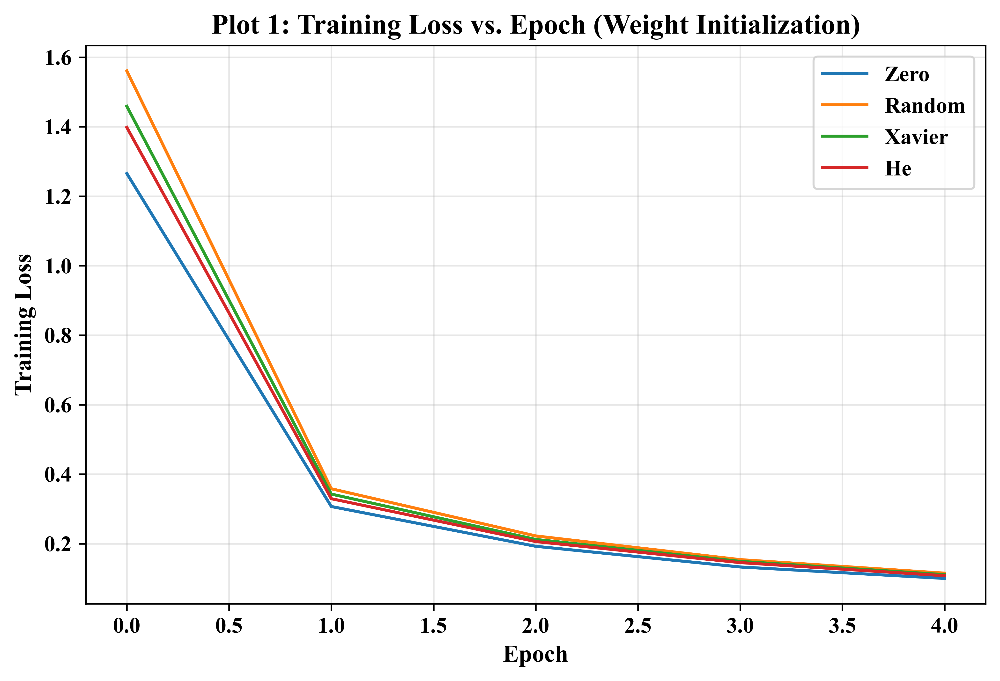

Saved: figures/plot02_weightinit_valacc.pdf


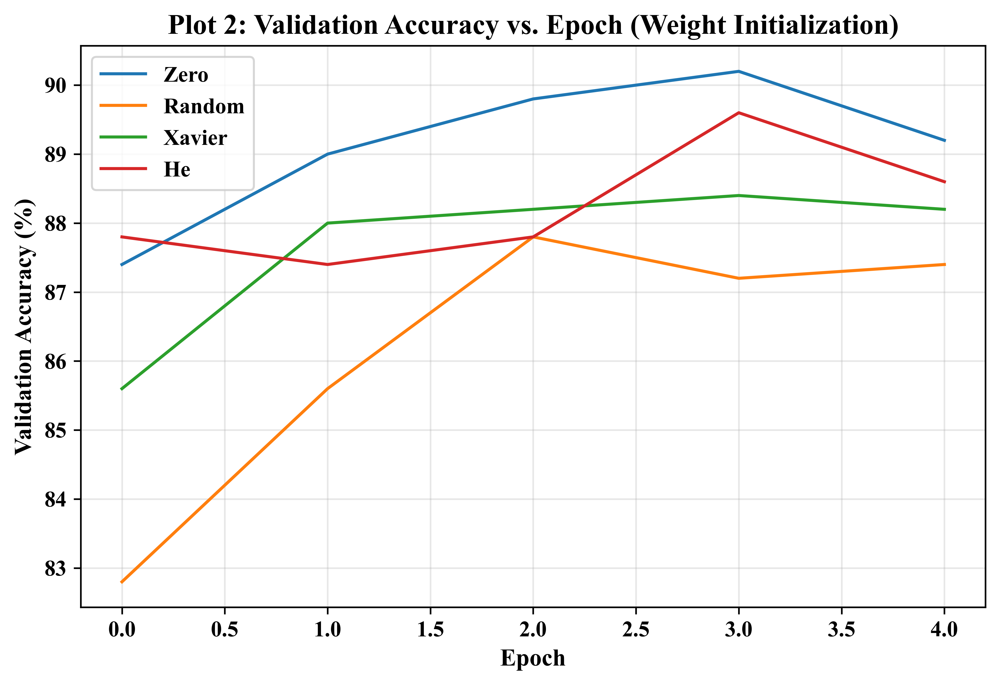

In [12]:
plt.figure(figsize=(8,5))
for name, h in init_histories.items():
    plt.plot(h["loss"], label=name)
plt.xlabel("Epoch"); plt.ylabel("Training Loss")
plt.title("Plot 1: Training Loss vs. Epoch (Weight Initialization)")
plt.legend(); plt.grid(alpha=0.3)
save_fig('plot01_weightinit_trainloss')
plt.show()

plt.figure(figsize=(8,5))
for name, h in init_histories.items():
    plt.plot(np.array(h["val_accuracy"]) * 100, label=name)
plt.xlabel("Epoch"); plt.ylabel("Validation Accuracy (%)")
plt.title("Plot 2: Validation Accuracy vs. Epoch (Weight Initialization)")
plt.legend(); plt.grid(alpha=0.3)
save_fig('plot02_weightinit_valacc')
plt.show()

In [13]:
regularization_configs = {
    "No Regularization": dict(dropout_rate=0.0, l2_reg=0.0,   batch_norm=False),
    "L2":                dict(dropout_rate=0.0, l2_reg=0.001, batch_norm=False),
    "Dropout":           dict(dropout_rate=0.5, l2_reg=0.0,   batch_norm=False),
    "BatchNorm":         dict(dropout_rate=0.0, l2_reg=0.0,   batch_norm=True),
}

reg_histories = load_ckpt('section6_reg_histories')
if reg_histories is None:
    reg_histories = {}
    for name, cfg in regularization_configs.items():
        print(f"Training: {name}")
        reset_memory()
        model = create_model(**cfg)
        history = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, verbose=1)
        reg_histories[name] = history.history
        del model
        reset_memory()
    save_ckpt('section6_reg_histories', reg_histories)
else:
    print("Loaded Section 6 results from checkpoint — skipped retraining.")

Training: No Regularization
Epoch 1/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - accuracy: 0.6776 - loss: 1.3738 - val_accuracy: 0.8420 - val_loss: 0.5598
Epoch 2/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9224 - loss: 0.3305 - val_accuracy: 0.8860 - val_loss: 0.4158
Epoch 3/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.9540 - loss: 0.2047 - val_accuracy: 0.8800 - val_loss: 0.3738
Epoch 4/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9736 - loss: 0.1481 - val_accuracy: 0.8900 - val_loss: 0.3600
Epoch 5/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9856 - loss: 0.1065 - val_accuracy: 0.8900 - val_loss: 0.3311
Training: L2
Epoch 1/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 24s 195ms/step - accuracy: 0.6532 - loss: 1.4968 - val_accuracy: 0.8680 - val_loss: 0.6479
Epoch 2/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9252 - loss: 0.4318 - val_accuracy: 0.8760 - val_loss: 0.5255
Epoch 3/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9552 - lo

Saved: figures/plot03_regularization_accuracy.pdf


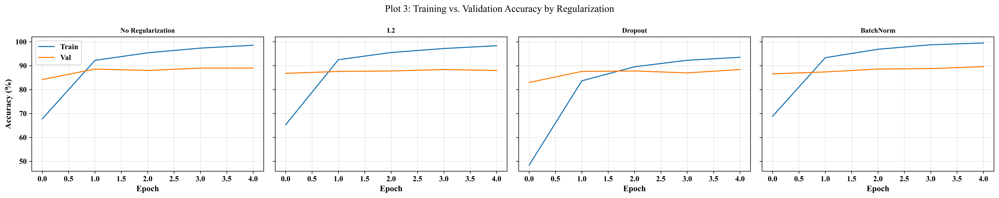

In [14]:
fig, axes = plt.subplots(1, len(reg_histories), figsize=(5*len(reg_histories), 4), sharey=True)
for ax, (name, h) in zip(axes, reg_histories.items()):
    ax.plot(np.array(h["accuracy"]) * 100, label="Train")
    ax.plot(np.array(h["val_accuracy"]) * 100, label="Val")
    ax.set_title(name, fontsize=10); ax.set_xlabel("Epoch"); ax.grid(alpha=0.3)
axes[0].set_ylabel("Accuracy (%)"); axes[0].legend()
fig.suptitle("Plot 3: Training vs. Validation Accuracy by Regularization")
plt.tight_layout()
save_fig('plot03_regularization_accuracy', fig=fig)
plt.show()

Saved: figures/plot04_regularization_loss.pdf


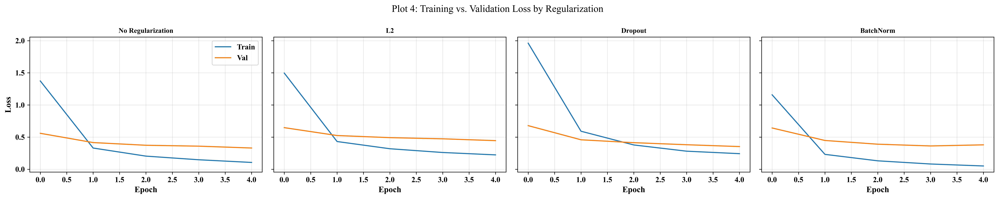

In [15]:
fig, axes = plt.subplots(1, len(reg_histories), figsize=(5*len(reg_histories), 4), sharey=True)
for ax, (name, h) in zip(axes, reg_histories.items()):
    ax.plot(h["loss"], label="Train")
    ax.plot(h["val_loss"], label="Val")
    ax.set_title(name, fontsize=10); ax.set_xlabel("Epoch"); ax.grid(alpha=0.3)
axes[0].set_ylabel("Loss"); axes[0].legend()
fig.suptitle("Plot 4: Training vs. Validation Loss by Regularization")
plt.tight_layout()
save_fig('plot04_regularization_loss', fig=fig)
plt.show()

In [16]:
x = np.array([2, 4, 6, 8], dtype=float)
mu = x.mean()
var = x.var()
eps = 1e-8
x_hat = (x - mu) / np.sqrt(var + eps)

gamma, beta = 1.0, 0.0
y = gamma * x_hat + beta

print(f"mu    = {mu}")
print(f"var   = {var}")
print(f"x_hat = {np.round(x_hat, 3)}")
print(f"y     = {np.round(y, 3)}  (gamma={gamma}, beta={beta})")

mu    = 5.0
var   = 5.0
x_hat = [-1.342 -0.447  0.447  1.342]
y     = [-1.342 -0.447  0.447  1.342]  (gamma=1.0, beta=0.0)


In [17]:
bn_histories = load_ckpt('section7_bn_histories')
if bn_histories is None:
    bn_histories = {}
    for use_bn in [False, True]:
        name = "With BatchNorm" if use_bn else "Without BatchNorm"
        print(f"Training: {name}")
        reset_memory()
        model = create_model(batch_norm=use_bn)
        history = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, verbose=1)
        bn_histories[name] = history.history
        del model
        reset_memory()
    save_ckpt('section7_bn_histories', bn_histories)
else:
    print("Loaded Section 7 results from checkpoint — skipped retraining.")

Training: Without BatchNorm
Epoch 1/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 24s 195ms/step - accuracy: 0.6704 - loss: 1.3941 - val_accuracy: 0.8500 - val_loss: 0.5778
Epoch 2/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9260 - loss: 0.3389 - val_accuracy: 0.8620 - val_loss: 0.4416
Epoch 3/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9600 - loss: 0.2112 - val_accuracy: 0.8800 - val_loss: 0.3990
Epoch 4/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9728 - loss: 0.1478 - val_accuracy: 0.8820 - val_loss: 0.3727
Epoch 5/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9836 - loss: 0.1111 - val_accuracy: 0.8880 - val_loss: 0.3546
Training: With BatchNorm
Epoch 1/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 25s 194ms/step - accuracy: 0.6800 - loss: 1.1573 - val_accuracy: 0.8300 - val_loss: 0.6741
Epoch 2/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9224 - loss: 0.2433 - val_accuracy: 0.8680 - val_loss: 0.4573
Epoch 3/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 4s 43ms/step - accuracy:

Saved: figures/plot05_batchnorm_valacc.pdf


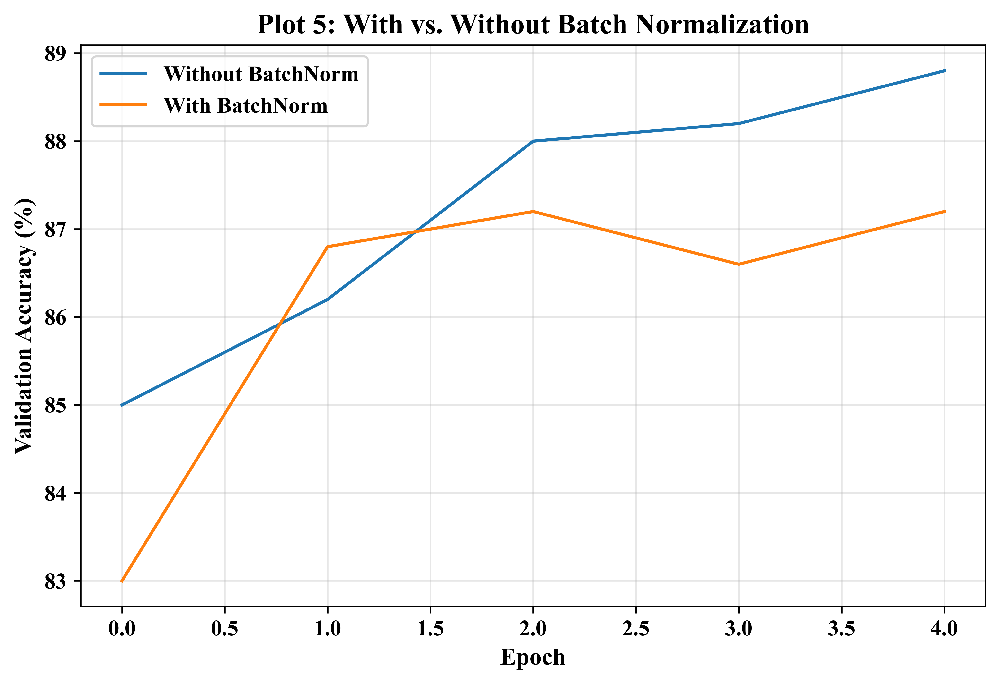

In [18]:
plt.figure(figsize=(8,5))
for name, h in bn_histories.items():
    plt.plot(np.array(h["val_accuracy"]) * 100, label=name)
plt.xlabel("Epoch"); plt.ylabel("Validation Accuracy (%)")
plt.title("Plot 5: With vs. Without Batch Normalization")
plt.legend(); plt.grid(alpha=0.3)
save_fig('plot05_batchnorm_valacc')
plt.show()

In [19]:
optimizers_list = ["sgd", "momentum", "rmsprop", "adam"]
ckpt8 = load_ckpt('section8_optimizers')
if ckpt8 is None:
    optimizer_histories = {}
    optimizer_results = []
    for opt_name in optimizers_list:
        print(f"Training with {opt_name}")
        reset_memory()
        model = create_model(optimizer=opt_name, learning_rate=0.001)
        t0 = time.time()
        history = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, verbose=1)
        elapsed = time.time() - t0
        optimizer_histories[opt_name] = history.history
        optimizer_results.append({
            "Optimizer": opt_name,
            "Final Loss": history.history["loss"][-1],
            "Best Validation Accuracy (%)": max(history.history["val_accuracy"]) * 100,
            "Training Time (s)": elapsed,
        })
        del model
        reset_memory()
    save_ckpt('section8_optimizers', {'histories': optimizer_histories, 'results': optimizer_results})
else:
    optimizer_histories, optimizer_results = ckpt8['histories'], ckpt8['results']
    print("Loaded Section 8 results from checkpoint — skipped retraining.")

optimizer_df = pd.DataFrame(optimizer_results)
optimizer_df

Training with sgd
Epoch 1/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 24s 191ms/step - accuracy: 0.0332 - loss: 3.8155 - val_accuracy: 0.0520 - val_loss: 3.6937
Epoch 2/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.0660 - loss: 3.5406 - val_accuracy: 0.0840 - val_loss: 3.4496
Epoch 3/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.1236 - loss: 3.2959 - val_accuracy: 0.1240 - val_loss: 3.2285
Epoch 4/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 43ms/step - accuracy: 0.1952 - loss: 3.0718 - val_accuracy: 0.1820 - val_loss: 3.0255
Epoch 5/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.2684 - loss: 2.8660 - val_accuracy: 0.2560 - val_loss: 2.8350
Training with momentum
Epoch 1/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 24s 195ms/step - accuracy: 0.2404 - loss: 3.0244 - val_accuracy: 0.6020 - val_loss: 2.0977
Epoch 2/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.7224 - loss: 1.5586 - val_accuracy: 0.7900 - val_loss: 1.2102
Epoch 3/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.8360 - lo

,Optimizer,Final Loss,Best Validation Accuracy (%),Training Time (s)
0,sgd,2.866007,25.600001,42.005183
1,momentum,0.567339,86.199999,42.453973
2,rmsprop,0.082695,87.800002,42.310442
3,adam,0.108293,88.000000,42.825323


Saved: figures/plot06_optimizers_trainloss.pdf


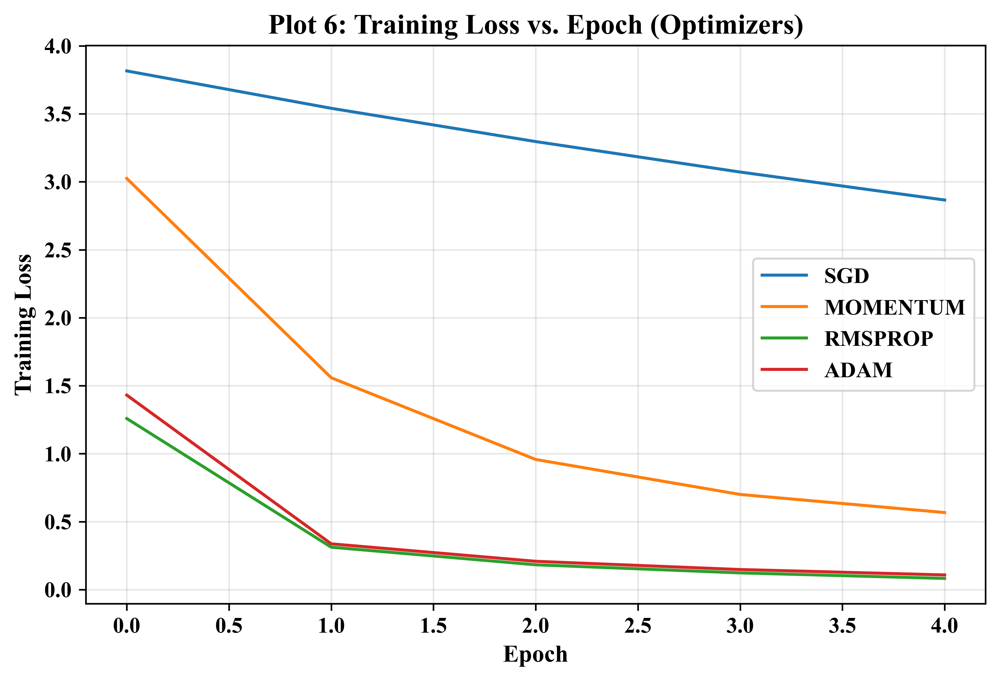

Saved: figures/plot07_optimizers_valacc.pdf


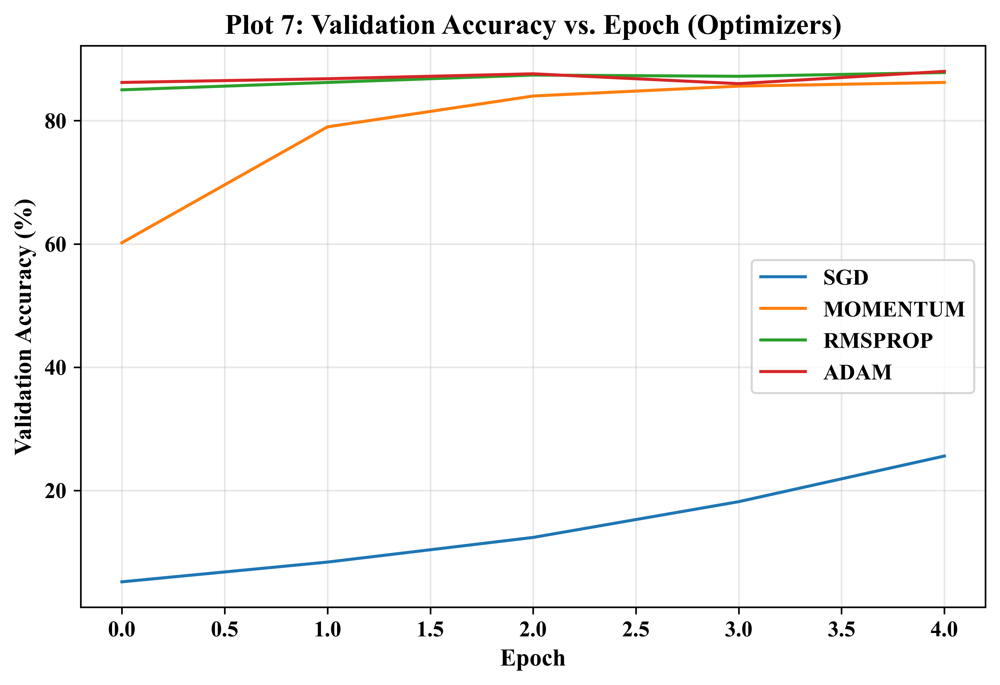

In [20]:
plt.figure(figsize=(8,5))
for name, h in optimizer_histories.items():
    plt.plot(h["loss"], label=name.upper())
plt.xlabel("Epoch"); plt.ylabel("Training Loss")
plt.title("Plot 6: Training Loss vs. Epoch (Optimizers)")
plt.legend(); plt.grid(alpha=0.3)
save_fig('plot06_optimizers_trainloss')
plt.show()

plt.figure(figsize=(8,5))
for name, h in optimizer_histories.items():
    plt.plot(np.array(h["val_accuracy"]) * 100, label=name.upper())
plt.xlabel("Epoch"); plt.ylabel("Validation Accuracy (%)")
plt.title("Plot 7: Validation Accuracy vs. Epoch (Optimizers)")
plt.legend(); plt.grid(alpha=0.3)
save_fig('plot07_optimizers_valacc')
plt.show()

In [21]:
def conv_output_size(N, K, P, S):
    return (N + 2*P - K) // S + 1

print("Example: N=224, K=3, P=1, S=2 ->", conv_output_size(224, 3, 1, 2))

Example: N=224, K=3, P=1, S=2 -> 112


In [22]:
learning_rates = [0.001, 0.0001]
lr_results = load_ckpt('section9_lr_results')
if lr_results is None:
    lr_results = []
    for lr in learning_rates:
        print(f"Learning rate: {lr}")
        reset_memory()
        model = create_model(optimizer="adam", learning_rate=lr)
        history = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, verbose=1)
        lr_results.append({"Learning Rate": lr, "Best Validation Accuracy (%)": max(history.history["val_accuracy"]) * 100})
        del model
        reset_memory()
    save_ckpt('section9_lr_results', lr_results)
else:
    print("Loaded LR sweep from checkpoint — skipped retraining.")

lr_df = pd.DataFrame(lr_results)
lr_df

Learning rate: 0.001
Epoch 1/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 24s 193ms/step - accuracy: 0.6608 - loss: 1.4397 - val_accuracy: 0.8840 - val_loss: 0.5445
Epoch 2/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - accuracy: 0.9276 - loss: 0.3330 - val_accuracy: 0.8880 - val_loss: 0.4087
Epoch 3/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9588 - loss: 0.2081 - val_accuracy: 0.8920 - val_loss: 0.3581
Epoch 4/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9732 - loss: 0.1481 - val_accuracy: 0.8880 - val_loss: 0.3475
Epoch 5/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9884 - loss: 0.1059 - val_accuracy: 0.8920 - val_loss: 0.3346
Learning rate: 0.0001
Epoch 1/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 24s 197ms/step - accuracy: 0.1220 - loss: 3.4130 - val_accuracy: 0.2840 - val_loss: 2.8754
Epoch 2/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.4328 - loss: 2.4591 - val_accuracy: 0.5480 - val_loss: 2.1355
Epoch 3/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.6752 - 

,Learning Rate,Best Validation Accuracy (%)
0,0.0010,89.200002
1,0.0001,81.199998


In [23]:
batch_sizes = [16, 32, 64]
batch_results = load_ckpt('section9_batch_results')
if batch_results is None:
    batch_results = []
    for bs in batch_sizes:
        print(f"Batch size: {bs}")
        train_temp = create_dataset(train_raw, batch_size=bs, shuffle=True)
        val_temp = create_dataset(val_raw, batch_size=bs)
        reset_memory()
        model = create_model()
        history = model.fit(train_temp, validation_data=val_temp, epochs=EPOCHS, verbose=1)
        batch_results.append({"Batch Size": bs, "Best Validation Accuracy (%)": max(history.history["val_accuracy"]) * 100})
        del model
        reset_memory()
    save_ckpt('section9_batch_results', batch_results)
else:
    print("Loaded batch-size sweep from checkpoint — skipped retraining.")

batch_df = pd.DataFrame(batch_results)
batch_df

Batch size: 16
Epoch 1/5


E0000 00:00:1788104372.507404     164 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


79/79 ━━━━━━━━━━━━━━━━━━━━ 25s 200ms/step - accuracy: 0.6620 - loss: 1.4076 - val_accuracy: 0.8440 - val_loss: 0.5520
Epoch 2/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9288 - loss: 0.3352 - val_accuracy: 0.8560 - val_loss: 0.4406
Epoch 3/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - accuracy: 0.9580 - loss: 0.2058 - val_accuracy: 0.8720 - val_loss: 0.3841
Epoch 4/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - accuracy: 0.9784 - loss: 0.1418 - val_accuracy: 0.8720 - val_loss: 0.3570
Epoch 5/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9864 - loss: 0.1059 - val_accuracy: 0.8820 - val_loss: 0.3553
Batch size: 64
Epoch 1/5


E0000 00:00:1788104480.159062     166 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


40/40 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - accuracy: 0.3363 - loss: 2.6884

E0000 00:00:1788104518.869152     167 cuda_timer.cc:87] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


40/40 ━━━━━━━━━━━━━━━━━━━━ 51s 716ms/step - accuracy: 0.5668 - loss: 1.8601 - val_accuracy: 0.8280 - val_loss: 0.7744
Epoch 2/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - accuracy: 0.9048 - loss: 0.4656 - val_accuracy: 0.8600 - val_loss: 0.5000
Epoch 3/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - accuracy: 0.9468 - loss: 0.2832 - val_accuracy: 0.8700 - val_loss: 0.4332
Epoch 4/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - accuracy: 0.9620 - loss: 0.2097 - val_accuracy: 0.8800 - val_loss: 0.4004
Epoch 5/5
40/40 ━━━━━━━━━━━━━━━━━━━━ 5s 85ms/step - accuracy: 0.9732 - loss: 0.1668 - val_accuracy: 0.8800 - val_loss: 0.3815


,Batch Size,Best Validation Accuracy (%)
0,16,89.399999
1,32,88.200003
2,64,88.000000


In [24]:
dropout_rates = [0.0, 0.25, 0.5]
dropout_results = load_ckpt('section9_dropout_results')
if dropout_results is None:
    dropout_results = []
    for dr in dropout_rates:
        print(f"Dropout rate: {dr}")
        reset_memory()
        model = create_model(dropout_rate=dr)
        history = model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, verbose=1)
        dropout_results.append({"Dropout Rate": dr, "Best Validation Accuracy (%)": max(history.history["val_accuracy"]) * 100})
        del model
        reset_memory()
    save_ckpt('section9_dropout_results', dropout_results)
else:
    print("Loaded dropout sweep from checkpoint — skipped retraining.")

dropout_df = pd.DataFrame(dropout_results)
dropout_df

Dropout rate: 0.0
Epoch 1/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 25s 197ms/step - accuracy: 0.6620 - loss: 1.4258 - val_accuracy: 0.8280 - val_loss: 0.6009
Epoch 2/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9300 - loss: 0.3371 - val_accuracy: 0.8580 - val_loss: 0.4535
Epoch 3/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9608 - loss: 0.2072 - val_accuracy: 0.8740 - val_loss: 0.3983
Epoch 4/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.9764 - loss: 0.1474 - val_accuracy: 0.8760 - val_loss: 0.3857
Epoch 5/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9844 - loss: 0.1103 - val_accuracy: 0.8720 - val_loss: 0.3761
Dropout rate: 0.25
Epoch 1/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 25s 201ms/step - accuracy: 0.6004 - loss: 1.5858 - val_accuracy: 0.8500 - val_loss: 0.6056
Epoch 2/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 46ms/step - accuracy: 0.8960 - loss: 0.4196 - val_accuracy: 0.8840 - val_loss: 0.4373
Epoch 3/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9420 - loss: 

,Dropout Rate,Best Validation Accuracy (%)
0,0.00,87.599999
1,0.25,88.800001
2,0.50,88.999999


Saved: figures/plot08to10_hyperparameter_sweeps.pdf


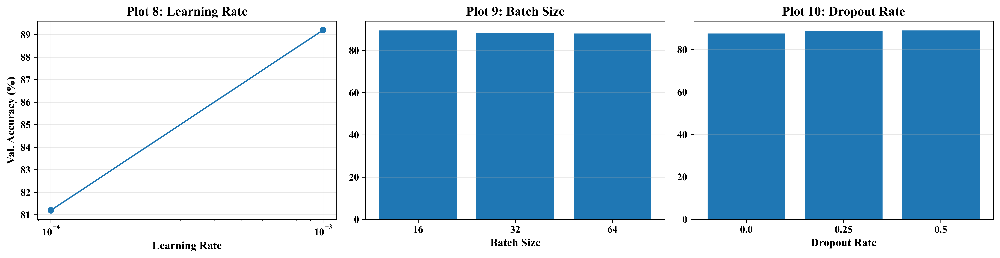

In [25]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

axes[0].plot(lr_df["Learning Rate"], lr_df["Best Validation Accuracy (%)"], marker='o')
axes[0].set_xscale('log'); axes[0].set_xlabel("Learning Rate"); axes[0].set_ylabel("Val. Accuracy (%)")
axes[0].set_title("Plot 8: Learning Rate"); axes[0].grid(alpha=0.3)

axes[1].bar(batch_df["Batch Size"].astype(str), batch_df["Best Validation Accuracy (%)"])
axes[1].set_xlabel("Batch Size"); axes[1].set_title("Plot 9: Batch Size"); axes[1].grid(alpha=0.3, axis='y')

axes[2].bar(dropout_df["Dropout Rate"].astype(str), dropout_df["Best Validation Accuracy (%)"])
axes[2].set_xlabel("Dropout Rate"); axes[2].set_title("Plot 10: Dropout Rate"); axes[2].grid(alpha=0.3, axis='y')

plt.tight_layout()
save_fig('plot08to10_hyperparameter_sweeps', fig=fig)
plt.show()

In [26]:
ckpt10 = load_ckpt('section10_transfer')
if ckpt10 is None:
    reset_memory()
    print("Case A: Feature Extraction")
    feature_model = create_model(dropout_rate=0.25, optimizer="adam", learning_rate=0.001, trainable_base=False)
    feature_history = feature_model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, verbose=1)

    print("\nCase B: Fine-Tuning (warm start from the trained feature_model)")
    base_model = None
    for layer in feature_model.layers:
        if isinstance(layer, tf.keras.Model):
            base_model = layer
            break
    base_model.trainable = True
    FINE_TUNE_AT = 100
    for layer in base_model.layers[:FINE_TUNE_AT]:
        layer.trainable = False

    feature_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),
                           loss="sparse_categorical_crossentropy", metrics=["accuracy"])
    fine_tune_history = feature_model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, verbose=1)

    fe_history, ft_history = feature_history.history, fine_tune_history.history
    save_ckpt('section10_transfer', {'fe': fe_history, 'ft': ft_history})
    del feature_model, base_model
    reset_memory()
else:
    fe_history, ft_history = ckpt10['fe'], ckpt10['ft']
    print("Loaded Section 10 results from checkpoint — skipped retraining.")

Case A: Feature Extraction
Epoch 1/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 26s 204ms/step - accuracy: 0.5828 - loss: 1.6485 - val_accuracy: 0.8420 - val_loss: 0.6198
Epoch 2/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.8996 - loss: 0.4142 - val_accuracy: 0.8560 - val_loss: 0.4584
Epoch 3/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.9444 - loss: 0.2667 - val_accuracy: 0.8760 - val_loss: 0.3861
Epoch 4/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 45ms/step - accuracy: 0.9560 - loss: 0.1928 - val_accuracy: 0.8760 - val_loss: 0.3664
Epoch 5/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 5s 44ms/step - accuracy: 0.9704 - loss: 0.1459 - val_accuracy: 0.8800 - val_loss: 0.3526

Case B: Fine-Tuning (warm start from the trained feature_model)
Epoch 1/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 51s 324ms/step - accuracy: 0.8868 - loss: 0.4025 - val_accuracy: 0.8840 - val_loss: 0.3412
Epoch 2/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step - accuracy: 0.9188 - loss: 0.2977 - val_accuracy: 0.8760 - val_loss: 0.3452
Epoch 3/5
79/79 ━━━━━━

Saved: figures/plot11_transferlearning_valacc.pdf


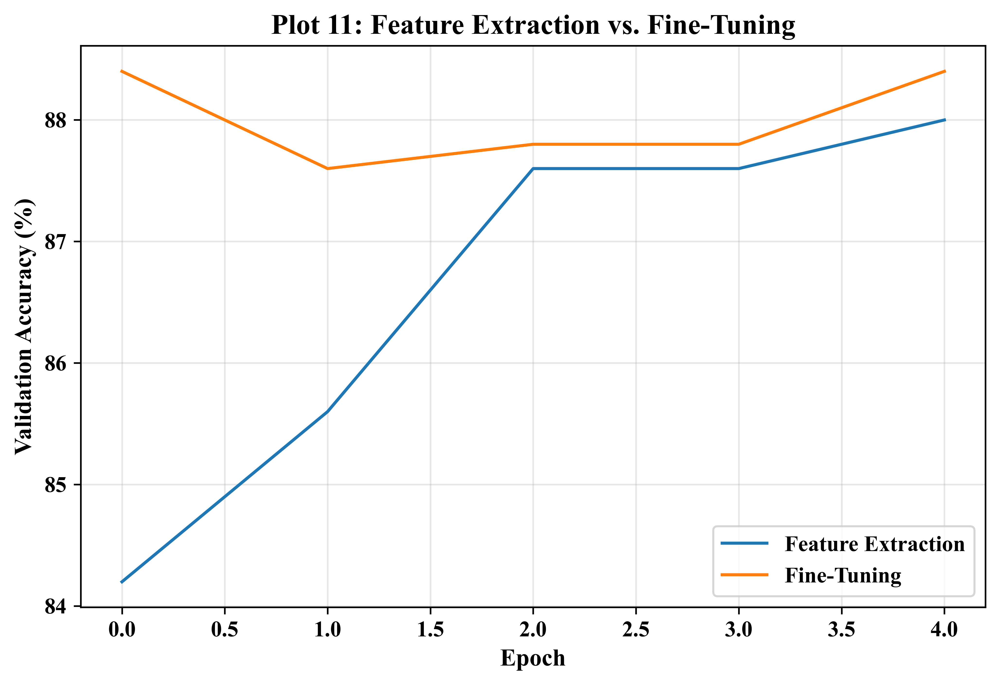

Saved: figures/plot12_transferlearning_loss.pdf


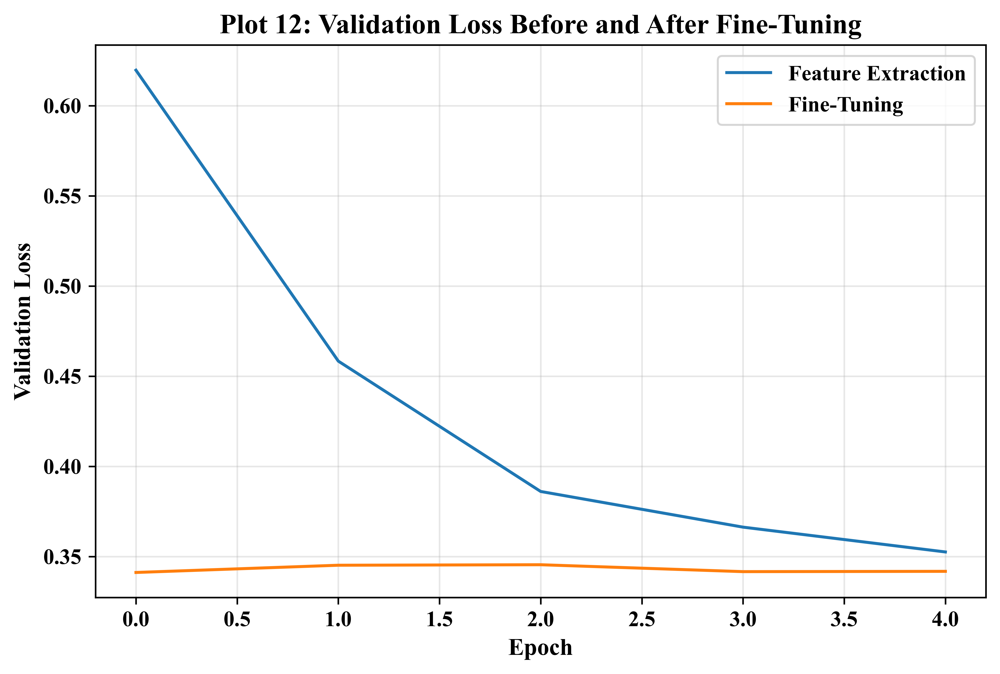

In [27]:
plt.figure(figsize=(8,5))
plt.plot(np.array(fe_history["val_accuracy"]) * 100, label="Feature Extraction")
plt.plot(np.array(ft_history["val_accuracy"]) * 100, label="Fine-Tuning")
plt.xlabel("Epoch"); plt.ylabel("Validation Accuracy (%)")
plt.title("Plot 11: Feature Extraction vs. Fine-Tuning")
plt.legend(); plt.grid(alpha=0.3)
save_fig('plot11_transferlearning_valacc')
plt.show()

plt.figure(figsize=(8,5))
plt.plot(fe_history["val_loss"], label="Feature Extraction")
plt.plot(ft_history["val_loss"], label="Fine-Tuning")
plt.xlabel("Epoch"); plt.ylabel("Validation Loss")
plt.title("Plot 12: Validation Loss Before and After Fine-Tuning")
plt.legend(); plt.grid(alpha=0.3)
save_fig('plot12_transferlearning_loss')
plt.show()

In [41]:
CV_SAMPLES = 1000
cv_pool = load_ckpt('section11_cv_pool')
if cv_pool is None:
    X_list, y_list = [], []
    for image, label in train_raw.take(CV_SAMPLES):
        image = tf.image.resize(image, (IMG_SIZE, IMG_SIZE))
        image = tf.cast(image, tf.float32)
        image = preprocess_input(image)
        X_list.append(image.numpy())
        y_list.append(label.numpy())
    X = np.array(X_list)
    y = np.array(y_list)
    save_ckpt('section11_cv_pool', {'X': X, 'y': y})
else:
    X, y = cv_pool['X'], cv_pool['y']
    print("Loaded CV data pool from checkpoint.")

print("X shape:", X.shape, "| y shape:", y.shape)

Loaded CV data pool from checkpoint.
X shape: (1000, 224, 224, 3) | y shape: (1000,)


In [42]:
candidate_configs = {
    "Baseline":             dict(dropout_rate=0.0, l2_reg=0.0, batch_norm=False, initializer="glorot_uniform", optimizer="adam", learning_rate=0.001, batch_size=32),
    "Best_Initialization":  dict(dropout_rate=0.0, l2_reg=0.0, batch_norm=False, initializer="zeros",           optimizer="adam", learning_rate=0.001, batch_size=32),
    "Best_Regularization":  dict(dropout_rate=0.0, l2_reg=0.0, batch_norm=True,  initializer="glorot_uniform", optimizer="adam", learning_rate=0.001, batch_size=32),
    "Best_Hyperparameters": dict(dropout_rate=0.5, l2_reg=0.0, batch_norm=False, initializer="glorot_uniform", optimizer="adam", learning_rate=0.001, batch_size=16),
}
K = 5
kf = KFold(n_splits=K, shuffle=True, random_state=SEED)

cv_results = {}
for config_name, cfg in candidate_configs.items():
    cached = load_ckpt(f'section11_cv_{config_name}')
    if cached is not None:
        cv_results[config_name] = cached
        print(f"Loaded {config_name} from checkpoint — skipped retraining.")
        continue

    print(f"Running cross-validation for {config_name}")
    fold_scores = []
    for fold, (train_index, val_index) in enumerate(kf.split(X)):
        print(f"  Fold {fold + 1}/{K}")
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        reset_memory()
        model = create_model(dropout_rate=cfg["dropout_rate"], l2_reg=cfg["l2_reg"],
                              batch_norm=cfg["batch_norm"], initializer=cfg["initializer"],
                              optimizer=cfg["optimizer"], learning_rate=cfg["learning_rate"])
        history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                             epochs=3, batch_size=cfg["batch_size"], verbose=0)
        fold_scores.append(max(history.history["val_accuracy"]))
        del model
        reset_memory()

    cv_results[config_name] = fold_scores
    save_ckpt(f'section11_cv_{config_name}', fold_scores)

if "Best_Optimizer" not in cv_results:
    cv_results["Best_Optimizer"] = cv_results["Baseline"]
    print("Best_Optimizer config is identical to Baseline (Adam, lr=1e-3) — reusing Baseline's CV result.")

Running cross-validation for Baseline
  Fold 1/5
  Fold 2/5
  Fold 3/5
  Fold 4/5
  Fold 5/5
Running cross-validation for Best_Initialization
  Fold 1/5
  Fold 2/5
  Fold 3/5
  Fold 4/5
  Fold 5/5
Running cross-validation for Best_Regularization
  Fold 1/5
  Fold 2/5
  Fold 3/5
  Fold 4/5
  Fold 5/5
Running cross-validation for Best_Hyperparameters
  Fold 1/5
  Fold 2/5
  Fold 3/5
  Fold 4/5
  Fold 5/5
Best_Optimizer config is identical to Baseline (Adam, lr=1e-3) — reusing Baseline's CV result.


In [43]:
fine_tune_cv_scores = load_ckpt('section11_cv_FineTuned')
if fine_tune_cv_scores is None:
    print("Running cross-validation for Fine-Tuned Model")
    fine_tune_cv_scores = []
    for fold, (train_index, val_index) in enumerate(kf.split(X)):
        print(f"  Fold {fold + 1}/{K}")
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        reset_memory()
        fold_model = create_model(dropout_rate=0.25, optimizer="adam", learning_rate=0.001, trainable_base=False)
        fold_model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=2, batch_size=32, verbose=0)

        fold_base = None
        for layer in fold_model.layers:
            if isinstance(layer, tf.keras.Model):
                fold_base = layer
                break
        fold_base.trainable = True
        for layer in fold_base.layers[:100]:
            layer.trainable = False
        fold_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),
                            loss="sparse_categorical_crossentropy", metrics=["accuracy"])
        history = fold_model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=2, batch_size=32, verbose=0)

        fine_tune_cv_scores.append(max(history.history["val_accuracy"]))
        del fold_model, fold_base
        reset_memory()

    save_ckpt('section11_cv_FineTuned', fine_tune_cv_scores)
else:
    print("Loaded Fine-Tuned Model CV results from checkpoint — skipped retraining.")

cv_results["Fine_Tuned_Model"] = fine_tune_cv_scores

Running cross-validation for Fine-Tuned Model
  Fold 1/5
  Fold 2/5
  Fold 3/5
  Fold 4/5
  Fold 5/5


In [44]:
cv_table = []
for config_name, scores in cv_results.items():
    row = {"Configuration": config_name}
    row.update({f"F{i+1}": scores[i]*100 for i in range(len(scores))})
    row["Mean Accuracy (%)"] = np.mean(scores) * 100
    row["SD (%)"] = np.std(scores) * 100
    cv_table.append(row)

cv_df = pd.DataFrame(cv_table)
cv_df

,Configuration,F1,F2,F3,F4,F5,Mean Accuracy (%),SD (%)
0,Baseline,87.000000,87.500000,83.999997,88.000000,85.500002,86.400000,1.462874
1,Best_Initialization,88.000000,88.000000,91.000003,89.499998,87.000000,88.700000,1.400001
2,Best_Regularization,81.500000,85.000002,87.500000,81.999999,83.999997,84.000000,2.167949
3,Best_Hyperparameters,87.000000,86.000001,84.500003,85.000002,83.499998,85.200001,1.208305
4,Best_Optimizer,87.000000,87.500000,83.999997,88.000000,85.500002,86.400000,1.462874
5,Fine_Tuned_Model,83.499998,84.500003,81.500000,84.500003,80.500001,82.900001,1.624808


Saved: figures/plot13_kfold_cv_accuracy.pdf


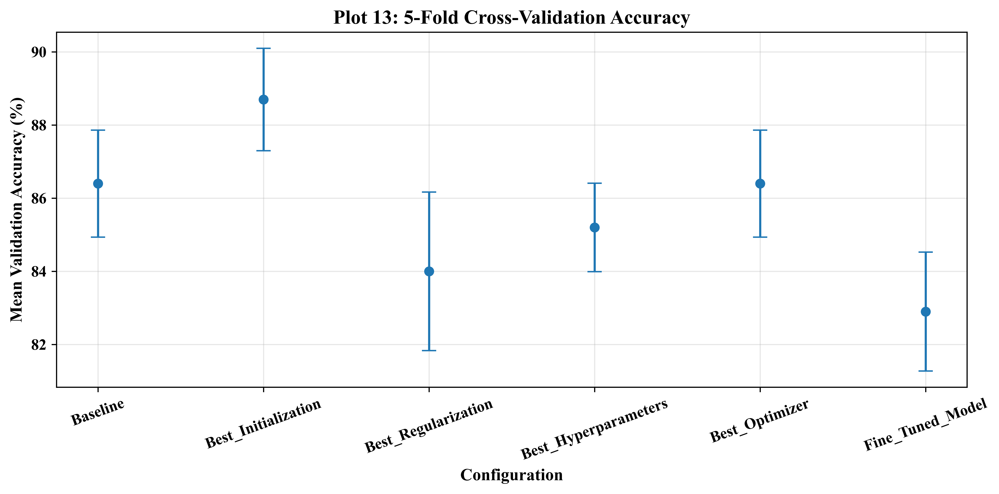

In [45]:
plt.figure(figsize=(10,5))
plt.errorbar(cv_df["Configuration"], cv_df["Mean Accuracy (%)"], yerr=cv_df["SD (%)"], fmt="o", capsize=5)
plt.xlabel("Configuration")
plt.ylabel("Mean Validation Accuracy (%)")
plt.title("Plot 13: 5-Fold Cross-Validation Accuracy")
plt.xticks(rotation=20)
plt.grid(alpha=0.3)
plt.tight_layout()
save_fig('plot13_kfold_cv_accuracy')
plt.show()

In [46]:
def train_and_evaluate_final(config_name, cfg):
    """Standard single-phase retrain + evaluate for the four head-only configs."""
    reset_memory()
    train_loader = create_dataset(train_raw, batch_size=cfg.get("batch_size", BATCH_SIZE), shuffle=True)
    test_loader = create_dataset(final_test_raw, batch_size=cfg.get("batch_size", BATCH_SIZE))

    model = create_model(dropout_rate=cfg["dropout_rate"], l2_reg=cfg["l2_reg"],
                          batch_norm=cfg["batch_norm"], initializer=cfg["initializer"],
                          optimizer=cfg["optimizer"], learning_rate=cfg["learning_rate"])
    t0 = time.time()
    model.fit(train_loader, epochs=EPOCHS, verbose=1)
    training_time = time.time() - t0

    test_loss, test_accuracy = model.evaluate(test_loader, verbose=0)
    num_params = model.count_params()

    y_true, y_pred = [], []
    for images, labels in test_loader:
        preds = model.predict(images, verbose=0)
        y_true.extend(labels.numpy())
        y_pred.extend(np.argmax(preds, axis=1))
    y_true, y_pred = np.array(y_true), np.array(y_pred)

    precision = precision_score(y_true, y_pred, average="weighted", zero_division=0)
    recall = recall_score(y_true, y_pred, average="weighted", zero_division=0)
    f1 = f1_score(y_true, y_pred, average="weighted", zero_division=0)

    del model
    reset_memory()

    return {
        'test_accuracy': test_accuracy, 'training_time': training_time, 'num_params': num_params,
        'precision': precision, 'recall': recall, 'f1': f1, 'y_true': y_true, 'y_pred': y_pred,
    }

def train_and_evaluate_finetuned():
    """Two-phase warm-start retrain + evaluate, matching Section 10's approach exactly."""
    reset_memory()
    model = create_model(dropout_rate=0.25, optimizer="adam", learning_rate=0.001, trainable_base=False)

    t0 = time.time()
    model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, verbose=1)

    base_model = None
    for layer in model.layers:
        if isinstance(layer, tf.keras.Model):
            base_model = layer
            break
    base_model.trainable = True
    for layer in base_model.layers[:100]:
        layer.trainable = False
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),
                  loss="sparse_categorical_crossentropy", metrics=["accuracy"])
    model.fit(train_ds, validation_data=val_ds, epochs=EPOCHS, verbose=1)
    training_time = time.time() - t0

    test_loss, test_accuracy = model.evaluate(test_ds, verbose=0)
    num_params = model.count_params()

    y_true, y_pred = [], []
    for images, labels in test_ds:
        preds = model.predict(images, verbose=0)
        y_true.extend(labels.numpy())
        y_pred.extend(np.argmax(preds, axis=1))
    y_true, y_pred = np.array(y_true), np.array(y_pred)

    precision = precision_score(y_true, y_pred, average="weighted", zero_division=0)
    recall = recall_score(y_true, y_pred, average="weighted", zero_division=0)
    f1 = f1_score(y_true, y_pred, average="weighted", zero_division=0)

    del model, base_model
    reset_memory()

    return {
        'test_accuracy': test_accuracy, 'training_time': training_time, 'num_params': num_params,
        'precision': precision, 'recall': recall, 'f1': f1, 'y_true': y_true, 'y_pred': y_pred,
    }

In [47]:
final_results = {}

for config_name, cfg in candidate_configs.items():
    cached = load_ckpt(f'section12_final_{config_name}')
    if cached is not None:
        final_results[config_name] = cached
        print(f"Loaded final results for {config_name} from checkpoint.")
        continue
    print(f"=== Final retrain + test evaluation: {config_name} ===")
    result = train_and_evaluate_final(config_name, cfg)
    final_results[config_name] = result
    save_ckpt(f'section12_final_{config_name}', result)

if "Best_Optimizer" not in final_results:
    final_results["Best_Optimizer"] = final_results["Baseline"]
    print("Best_Optimizer config is identical to Baseline — reusing Baseline's final test results.")

cached_ft = load_ckpt('section12_final_FineTuned')
if cached_ft is not None:
    final_results["Fine_Tuned_Model"] = cached_ft
    print("Loaded final results for Fine_Tuned_Model from checkpoint.")
else:
    print("=== Final retrain + test evaluation: Fine_Tuned_Model ===")
    result = train_and_evaluate_finetuned()
    final_results["Fine_Tuned_Model"] = result
    save_ckpt('section12_final_FineTuned', result)

=== Final retrain + test evaluation: Baseline ===
Epoch 1/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 16s 81ms/step - accuracy: 0.6636 - loss: 1.4267
Epoch 2/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - accuracy: 0.9248 - loss: 0.3364
Epoch 3/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - accuracy: 0.9548 - loss: 0.2089
Epoch 4/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - accuracy: 0.9768 - loss: 0.1445
Epoch 5/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - accuracy: 0.9852 - loss: 0.1076
=== Final retrain + test evaluation: Best_Initialization ===
Epoch 1/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 15s 81ms/step - accuracy: 0.7632 - loss: 1.2653
Epoch 2/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - accuracy: 0.9372 - loss: 0.3070
Epoch 3/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - accuracy: 0.9676 - loss: 0.1926
Epoch 4/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - accuracy: 0.9816 - loss: 0.1330
Epoch 5/5
79/79 ━━━━━━━━━━━━━━━━━━━━ 4s 34ms/step - accuracy: 0.9876 - loss: 0.1001
=== Final retrain + test evaluation: Best_Regul

In [48]:
summary_rows = []
for config_name in cv_df["Configuration"]:
    cv_row = cv_df[cv_df["Configuration"] == config_name].iloc[0]
    fr = final_results[config_name]
    summary_rows.append({
        "Configuration": config_name,
        "CV Accuracy (%)": round(cv_row["Mean Accuracy (%)"], 2),
        "SD (%)": round(cv_row["SD (%)"], 2),
        "Test Accuracy (%)": round(fr["test_accuracy"] * 100, 2),
        "Training Time (s)": round(fr["training_time"], 2),
    })
summary_df = pd.DataFrame(summary_rows)
summary_df

,Configuration,CV Accuracy (%),SD (%),Test Accuracy (%),Training Time (s)
0,Baseline,86.4,1.46,90.6,31.09
1,Best_Initialization,88.7,1.40,90.0,30.60
2,Best_Regularization,84.0,2.17,87.8,31.95
3,Best_Hyperparameters,85.2,1.21,88.8,33.34
4,Best_Optimizer,86.4,1.46,90.6,31.09
5,Fine_Tuned_Model,82.9,1.62,89.4,105.98


In [49]:
best_config_name = summary_df.loc[summary_df["Test Accuracy (%)"].idxmax(), "Configuration"]
y_true = final_results[best_config_name]['y_true']
y_pred = final_results[best_config_name]['y_pred']
print("Best overall configuration (by test accuracy):", best_config_name)

Best overall configuration (by test accuracy): Baseline


In [50]:
cm = confusion_matrix(y_true, y_pred, labels=range(NUM_CLASSES))

plt.figure(figsize=(18, 16))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=True,
            xticklabels=class_names, yticklabels=class_names, annot_kws={"size": 8})
plt.title(f"Plot 14: Confusion Matrix — {best_config_name}", fontsize=18, pad=20)
plt.xlabel("Predicted Label", fontsize=14)
plt.ylabel("True Label", fontsize=14)
plt.xticks(rotation=90, fontsize=9)
plt.yticks(rotation=0, fontsize=9)
plt.tight_layout()
save_fig('plot14_confusion_matrix')
plt.show()

present = np.unique(y_true)
per_class_acc = {c: cm[c, c] / cm[c].sum() for c in present if cm[c].sum() > 0}
ranked = sorted(per_class_acc.items(), key=lambda kv: kv[1], reverse=True)
print("Best-classified breeds:", [class_names[c] for c, _ in ranked[:5]])
print("Worst-classified breeds:", [class_names[c] for c, _ in ranked[-5:]])

Saved: figures/plot14_confusion_matrix.pdf


Best-classified breeds: ['american_bulldog', 'beagle', 'Birman', 'boxer', 'german_shorthaired']
Worst-classified breeds: ['chihuahua', 'Russian_Blue', 'american_pit_bull_terrier', 'British_Shorthair', 'Ragdoll']


In [58]:
best_cv_row = cv_df[cv_df["Configuration"] == best_config_name].iloc[0]

final_results = pd.DataFrame({
    "Metric": ["Mean CV Accuracy", "CV Standard Deviation", "Test Accuracy",
               "Precision", "Recall", "F1-score", "Training Time (seconds)", "Number of Parameters"],
    "Value": [
        f"{best_cv_row['Mean Accuracy (%)']:.2f}%",
        f"{best_cv_row['SD (%)']:.2f}%",
        f"{test_accuracy*100:.2f}%",
        f"{precision*100:.2f}%",
        f"{recall*100:.2f}%",
        f"{f1*100:.2f}%",
        f"{training_time:.2f}",
        f"{num_params:,}",
    ]
})
final_results

,Metric,Value
0,Mean CV Accuracy,86.40%
1,CV Standard Deviation,1.46%
2,Test Accuracy,87.60%
3,Precision,89.37%
4,Recall,87.60%
5,F1-score,87.56%
6,Training Time (seconds),42.86
7,Number of Parameters,"2,305,381"


Saved: figures/plot15_misclassified_images.pdf


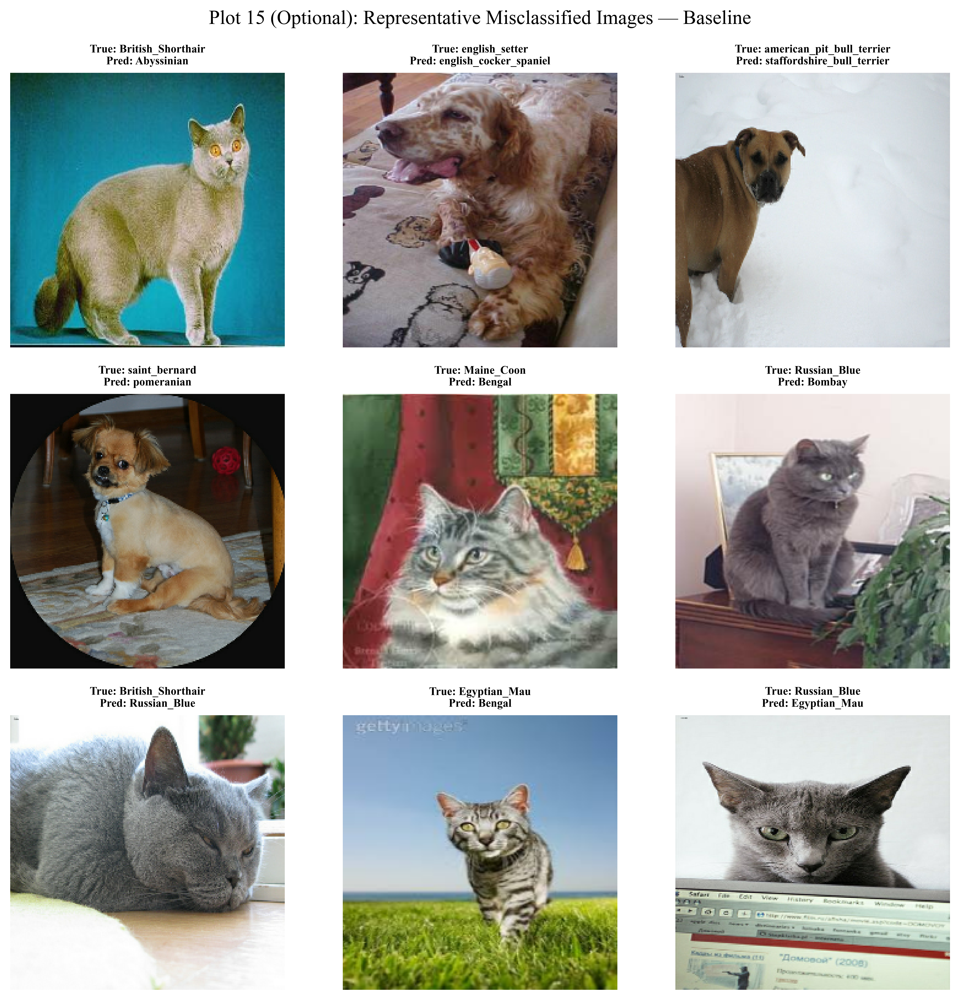

In [ ]:
mis_idx = np.where(y_true != y_pred)[0][:9]

raw_imgs = []
for img, lbl in tfds.as_numpy(final_test_raw.map(lambda x, y: (tf.image.resize(x, (IMG_SIZE, IMG_SIZE)), y))):
    raw_imgs.append(img.astype('uint8'))

fig, axes = plt.subplots(3, 3, figsize=(10, 10))
for ax, idx in zip(axes.flat, mis_idx):
    ax.imshow(raw_imgs[idx])
    ax.set_title(f"True: {class_names[y_true[idx]]}\nPred: {class_names[y_pred[idx]]}", fontsize=8)
    ax.axis('off')
plt.suptitle(f'Plot 15 (Optional): Representative Misclassified Images — {best_config_name}')
plt.tight_layout()
save_fig('plot15_misclassified_images', fig=fig)
plt.show()

In [59]:
overall_results = summary_df.rename(columns={
    "CV Accuracy (%)": "CV Accuracy",
    "SD (%)": "SD",
    "Test Accuracy (%)": "Test Accuracy",
}).copy()
overall_results["CV Accuracy"] = overall_results["CV Accuracy"].map(lambda v: f"{v:.2f}%")
overall_results["SD"] = overall_results["SD"].map(lambda v: f"{v:.2f}%")
overall_results["Test Accuracy"] = overall_results["Test Accuracy"].map(lambda v: f"{v:.2f}%")
overall_results["Training Time"] = overall_results["Training Time (s)"].map(lambda v: f"{v:.2f}s")
overall_results = overall_results[["Configuration", "CV Accuracy", "SD", "Test Accuracy", "Training Time"]]
overall_results

,Configuration,CV Accuracy,SD,Test Accuracy,Training Time
0,Baseline,86.40%,1.46%,90.60%,31.09s
1,Best_Initialization,88.70%,1.40%,90.00%,30.60s
2,Best_Regularization,84.00%,2.17%,87.80%,31.95s
3,Best_Hyperparameters,85.20%,1.21%,88.80%,33.34s
4,Best_Optimizer,86.40%,1.46%,90.60%,31.09s
5,Fine_Tuned_Model,82.90%,1.62%,89.40%,105.98s


In [53]:
extra_configs = {
    "C4_HighDropout_HighLR": dict(dropout_rate=0.5,  optimizer="adam", learning_rate=0.001),
    "C5_SGD_Baseline":       dict(dropout_rate=0.0,  optimizer="sgd",  learning_rate=0.001),
}

In [54]:
for config_name, cfg in extra_configs.items():
    cached = load_ckpt(f'extra_cv_{config_name}')
    if cached is not None:
        cv_results[config_name] = cached
        print(f"Loaded {config_name} from checkpoint — skipped retraining.")
        continue

    print(f"Running cross-validation for {config_name}")
    fold_scores = []
    for fold, (train_index, val_index) in enumerate(kf.split(X)):
        print(f"  Fold {fold + 1}/{K}")
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]

        reset_memory()
        model = create_model(dropout_rate=cfg["dropout_rate"], optimizer=cfg["optimizer"],
                              learning_rate=cfg["learning_rate"])
        history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                             epochs=3, batch_size=32, verbose=0)
        fold_scores.append(max(history.history["val_accuracy"]))
        del model
        reset_memory()

    cv_results[config_name] = fold_scores
    save_ckpt(f'extra_cv_{config_name}', fold_scores)

Loaded C4_HighDropout_HighLR from checkpoint — skipped retraining.
Loaded C5_SGD_Baseline from checkpoint — skipped retraining.


In [55]:
extra_cv_table = []
for config_name in list(candidate_configs.keys()) + list(extra_configs.keys()):
    scores = cv_results[config_name]
    row = {"Configuration": config_name}
    row.update({f"F{i+1}": scores[i]*100 for i in range(len(scores))})
    row["Mean Accuracy (%)"] = np.mean(scores) * 100
    row["SD (%)"] = np.std(scores) * 100
    extra_cv_table.append(row)

extra_cv_df = pd.DataFrame(extra_cv_table)
extra_cv_df

,Configuration,F1,F2,F3,F4,F5,Mean Accuracy (%),SD (%)
0,Baseline,87.000000,87.500000,83.999997,88.000000,85.500002,86.400000,1.462874
1,Best_Initialization,88.000000,88.000000,91.000003,89.499998,87.000000,88.700000,1.400001
2,Best_Regularization,81.500000,85.000002,87.500000,81.999999,83.999997,84.000000,2.167949
3,Best_Hyperparameters,87.000000,86.000001,84.500003,85.000002,83.499998,85.200001,1.208305
4,C4_HighDropout_HighLR,83.499998,87.000000,86.000001,83.499998,82.499999,84.499999,1.702940
5,C5_SGD_Baseline,7.000000,4.000000,9.000000,4.000000,8.500000,6.500000,2.144761


Saved: figures/plot16_additional_exercise_cv_accuracy.pdf


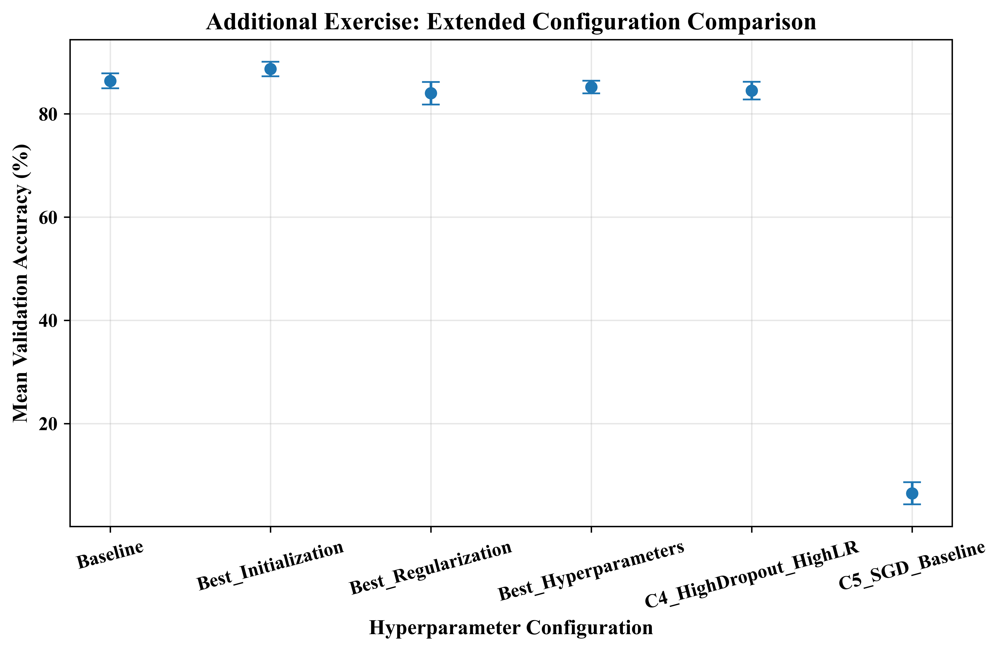

Original best configuration: Baseline (86.40%)
Best configuration including new candidates: Best_Initialization (88.70%)


In [56]:
plt.figure(figsize=(9,5))
plt.errorbar(extra_cv_df["Configuration"], extra_cv_df["Mean Accuracy (%)"],
             yerr=extra_cv_df["SD (%)"], fmt="o", capsize=5)
plt.xlabel("Hyperparameter Configuration")
plt.ylabel("Mean Validation Accuracy (%)")
plt.title("Additional Exercise: Extended Configuration Comparison")
plt.xticks(rotation=15)
plt.grid(alpha=0.3)
save_fig('plot16_additional_exercise_cv_accuracy')
plt.show()

print(f"Original best configuration: {best_config_name} "
      f"({extra_cv_df.loc[extra_cv_df['Configuration']==best_config_name, 'Mean Accuracy (%)'].values[0]:.2f}%)")

new_best = extra_cv_df.loc[extra_cv_df["Mean Accuracy (%)"].idxmax(), "Configuration"]
print(f"Best configuration including new candidates: {new_best} "
      f"({extra_cv_df['Mean Accuracy (%)'].max():.2f}%)")

In [57]:
extra_configs = {
    "New_Combo_1": dict(dropout_rate=0.25, l2_reg=0.0, batch_norm=False,
                         initializer="glorot_uniform", optimizer="adam",
                         learning_rate=0.0001, batch_size=64),
}

for config_name, cfg in extra_configs.items():
    cached = load_ckpt(f'section11_cv_{config_name}')
    if cached is None:
        print(f"Running cross-validation for {config_name}")
        fold_scores = []
        for fold, (train_index, val_index) in enumerate(kf.split(X)):
            print(f"  Fold {fold + 1}/{K}")
            X_train, X_val = X[train_index], X[val_index]
            y_train, y_val = y[train_index], y[val_index]
            reset_memory()
            model = create_model(**{k: v for k, v in cfg.items() if k != "batch_size"})
            history = model.fit(X_train, y_train, validation_data=(X_val, y_val),
                                 epochs=3, batch_size=cfg["batch_size"], verbose=0)
            fold_scores.append(max(history.history["val_accuracy"]))
            del model
            reset_memory()
        save_ckpt(f'section11_cv_{config_name}', fold_scores)
        cached = fold_scores
    cv_results[config_name] = cached
    print(f"{config_name}: {np.mean(cached)*100:.2f}% ± {np.std(cached)*100:.2f}%")

cached_ft2 = load_ckpt('section11_cv_New_Combo_2')
if cached_ft2 is None:
    print("Running cross-validation for New_Combo_2")
    cached_ft2 = []
    for fold, (train_index, val_index) in enumerate(kf.split(X)):
        print(f"  Fold {fold + 1}/{K}")
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]
        reset_memory()
        fold_model = create_model(dropout_rate=0.25, optimizer="adam", learning_rate=0.001, trainable_base=False)
        fold_model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=2, batch_size=32, verbose=0)
        fold_base = next(l for l in fold_model.layers if isinstance(l, tf.keras.Model))
        fold_base.trainable = True
        for layer in fold_base.layers[:50]:
            layer.trainable = False
        fold_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.00001),
                            loss="sparse_categorical_crossentropy", metrics=["accuracy"])
        history = fold_model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=2, batch_size=32, verbose=0)
        cached_ft2.append(max(history.history["val_accuracy"]))
        del fold_model, fold_base
        reset_memory()
    save_ckpt('section11_cv_New_Combo_2', cached_ft2)
cv_results["New_Combo_2"] = cached_ft2
print(f"New_Combo_2: {np.mean(cached_ft2)*100:.2f}% ± {np.std(cached_ft2)*100:.2f}%")

Running cross-validation for New_Combo_1
  Fold 1/5
  Fold 2/5
  Fold 3/5
  Fold 4/5
  Fold 5/5
New_Combo_1: 9.00% ± 1.84%
Running cross-validation for New_Combo_2
  Fold 1/5
  Fold 2/5
  Fold 3/5
  Fold 4/5
  Fold 5/5
New_Combo_2: 82.50% ± 0.84%
